# Data preparation

In [1]:
from lib import *

0        0
1        1
2        0
3        0
4        1
        ..
43195    1
43196    2
43197    2
43198    0
43199    2
Name: Avg. Readers_Joy, Length: 43200, dtype: int64
0        [0, 2, 0, 0, 0, 0, 0, 0]
1        [1, 0, 0, 2, 0, 0, 0, 0]
2        [0, 0, 0, 1, 0, 0, 0, 0]
3        [0, 1, 0, 0, 0, 0, 1, 0]
4        [1, 0, 0, 1, 0, 0, 0, 0]
                   ...           
43195    [1, 0, 0, 1, 0, 0, 0, 0]
43196    [2, 0, 2, 0, 0, 0, 0, 0]
43197    [2, 0, 0, 0, 0, 0, 0, 0]
43198    [0, 0, 2, 0, 0, 0, 0, 0]
43199    [2, 0, 0, 0, 0, 0, 0, 1]
Name: readers_emotion_intensities, Length: 43200, dtype: object
---
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 18237 entries, 0 to 18236
Data columns (total 45 columns):
 #   Column                       Non-Null Count  Dtype 
---  ------                       --------------  ----- 
 0   Sentence                     18237 non-null  object
 1   UserID                       18237 non-null  int64 
 2   Datetime                     18237 non-null

In [2]:
# reindex
df_wrime_target = df_wrime_target.reset_index(drop=True)
# df_wrime_target.info()

# print(sum(df_wrime_target['Train/Dev/Test'] == 'train'))
# print(sum(df_wrime_target['Train/Dev/Test'] == 'dev'))
# print(sum(df_wrime_target['Train/Dev/Test'] == 'test'))

In [3]:
sentences = df_wrime_target['Sentence'].tolist()

# replace '\n' with ''
sentences = [sentence.replace('\\n', ' ') for sentence in sentences]
# replace 'x000D' with ''
sentences = [sentence.replace('x000D', ' ') for sentence in sentences]

# Prepare embeddings of tweets based on emotional intensities. 

In [4]:
flag = "fine_tuned" # or "word2vec" #  "pretrained" # 
# flag = "fine_tuned_2_fold_CV" # or "word2vec" #  "pretrained" #

In [5]:
from transformers import AutoTokenizer, AutoModelForSequenceClassification


# Load pretrained model/tokenizer. 
checkpoint = 'cl-tohoku/bert-base-japanese-whole-word-masking' # 'cl-tohoku/bert-base-japanese-v2'
tokenizer = AutoTokenizer.from_pretrained(checkpoint)

embedding_path = "output"
if not os.path.isdir(embedding_path):
    os.makedirs(embedding_path)

if flag == "pretrained":
    model = AutoModelForSequenceClassification.from_pretrained(checkpoint, output_hidden_states=True) # output_hidden_states=True allows us to access hidden states. 
    path_to_embeddings = os.path.join(embedding_path, 'pretrained_embeddings.tsv')

# elif flag == "fine_tuned_2_fold_CV":
elif flag == "fine_tuned":
    models = []
    for fold in range(2):
        # trained_model_1 and trained_model_2
        model = AutoModelForSequenceClassification.from_pretrained(os.path.join("output", f"trained_model_{fold}"), output_hidden_states=True)
        models.append(model)
    path_to_embeddings = os.path.join(embedding_path, 'fine-tuned_embeddings_2_fold_CV.tsv')

# elif flag == "fine_tuned":
#     model = AutoModelForSequenceClassification.from_pretrained(os.path.join("output", "trained_model"), output_hidden_states=True) # output_hidden_states=True allows us to access hidden states.
#     path_to_embeddings = os.path.join(embedding_path, 'fine-tuned_embeddings.tsv')

elif flag == "word2vec":
    path_to_embeddings = os.path.join(embedding_path, 'word2vec_embeddings.tsv')

permutation_for_cluster_IDs = map_of_permutation_for_cluster_IDs[flag]

if os.path.isfile(path_to_embeddings):
    df_embeddings = pd.read_table(path_to_embeddings, header=None)
elif flag == "fine_tuned_2_fold_CV":
    df_embeddings = make_embeddings_by_bert_2_fold_CV(sentences, tokenizer, models, path_to_embeddings)
else:
    if flag == "word2vec":
        df_embeddings = make_embeddings_by_word2vec(sentences, path_to_embeddings)
    else:
        df_embeddings = make_embeddings_by_bert(sentences, tokenizer, model, path_to_embeddings)

/home/om/.miniconda3/envs/emotion/lib/python3.11/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm
/home/om/.miniconda3/envs/emotion/lib/python3.11/site-packages/huggingface_hub/file_download.py:1150: FutureWarning: `resume_download` is deprecated and will be removed in version 1.0.0. Downloads always resume when possible. If you want to force a new download, use `force_download=True`.
  warnings.warn(


---

# K-means clustering by embeddings. 

In [6]:
from sklearn.cluster import KMeans

k = 6 # number of clusters
kmeansModel = KMeans(n_clusters=k, random_state=0).fit(df_embeddings)

# Cluster ID (0-based) for each tweet. 
clusters = kmeansModel.labels_
# Cluster ID is 1-based. 
clusters = clusters + 1
print(kmeansModel.labels_)
print(len(kmeansModel.labels_))
print(clusters)

/home/om/.miniconda3/envs/emotion/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


[3 4 0 ... 2 1 2]
18237
[4 5 1 ... 3 2 3]


In [7]:
# Load the intensity-based clusters
_df = pd.read_csv(os.path.join('output', 'emotion_6_clusters.tsv'), sep='\t', header=None)
# emotion_clusters = _df[0].tolist()
# emotion_clusters = [int(x) for x in emotion_clusters]
emotion_clusters = [int(x) for x in _df[0].tolist()]
df_intensity_clusters = pd.DataFrame(emotion_clusters, columns=['labels'])
df_intensity_clusters.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 18237 entries, 0 to 18236
Data columns (total 1 columns):
 #   Column  Non-Null Count  Dtype
---  ------  --------------  -----
 0   labels  18237 non-null  int64
dtypes: int64(1)
memory usage: 142.6 KB


## Comparison the generated clusters with the intensity-based clusters. 

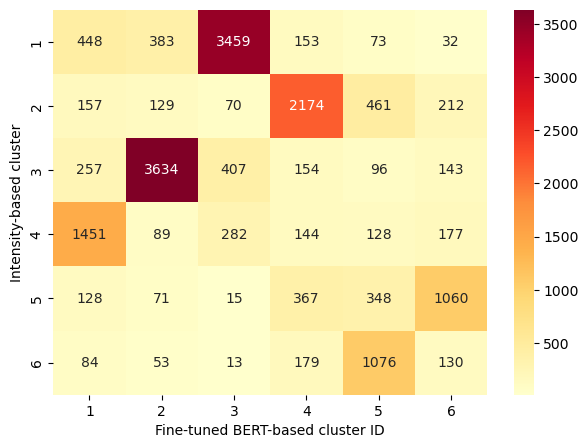

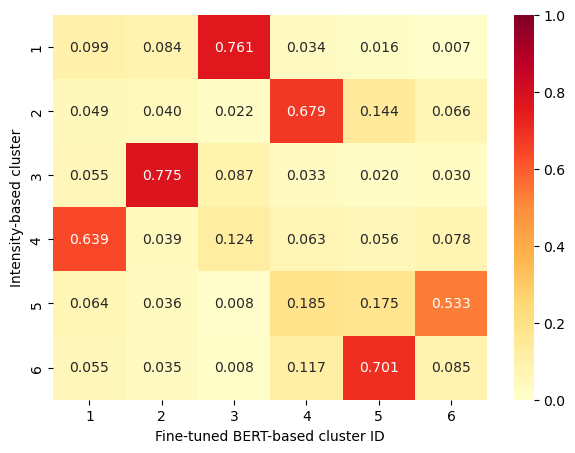

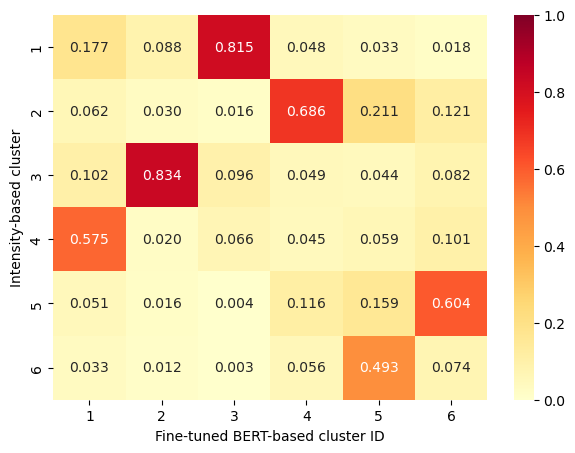

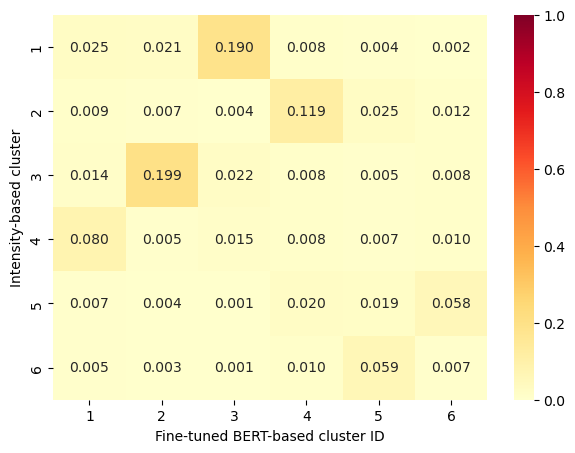

In [8]:
df_clusters = pd.DataFrame(clusters, columns=['clusters'])
conf_mat = confusion_matrix(df_intensity_clusters['labels'], df_clusters['clusters'], labels=list(set(emotion_clusters))) # confusion matrix
# conf_mat_norm_by_row = conf_mat.astype('float') / conf_mat.sum(axis=1)[:, np.newaxis] # Normalize the confusion matrix by row. 
# conf_mat_norm_by_column = conf_mat.astype('float') / conf_mat.sum(axis=0)[:, np.newaxis] # Normalize the confusion matrix by row. 

conf_mat_norm_by_row = confusion_matrix(df_intensity_clusters['labels'], df_clusters['clusters'], labels=list(set(emotion_clusters)), normalize='true') 
conf_mat_norm_by_column = confusion_matrix(df_intensity_clusters['labels'], df_clusters['clusters'], labels=list(set(emotion_clusters)), normalize='pred') 
conf_mat_norm_by_all = confusion_matrix(df_intensity_clusters['labels'], df_clusters['clusters'], labels=list(set(emotion_clusters)), normalize='all') 

# Heatmap of the confusion matrix
plt.figure(figsize=(7, 5))
sns.heatmap(conf_mat, annot=True, cmap='YlOrRd', fmt='g')
plt.xlabel(dic_of_x_axis_labels[flag])
plt.ylabel('Intensity-based cluster')
plt.xticks(np.arange(len(set(emotion_clusters))) + 0.5, range(1, len(set(emotion_clusters)) + 1))
plt.yticks(np.arange(len(set(emotion_clusters))) + 0.5, range(1, len(set(emotion_clusters)) + 1))
plt.show()

# Heatmap of the normalized confusion matrix
plt.figure(figsize=(7, 5))
sns.heatmap(conf_mat_norm_by_row, annot=True, cmap='YlOrRd', fmt='.3f', vmin=0, vmax=1)
plt.xlabel(dic_of_x_axis_labels[flag])
plt.ylabel('Intensity-based cluster')
plt.xticks(np.arange(len(set(emotion_clusters))) + 0.5, range(1, len(set(emotion_clusters)) + 1))
plt.yticks(np.arange(len(set(emotion_clusters))) + 0.5, range(1, len(set(emotion_clusters)) + 1))
plt.show()

# Heatmap of the normalized confusion matrix
plt.figure(figsize=(7, 5))
sns.heatmap(conf_mat_norm_by_column, annot=True, cmap='YlOrRd', fmt='.3f', vmin=0, vmax=1)
plt.xlabel(dic_of_x_axis_labels[flag])
plt.ylabel('Intensity-based cluster')
plt.xticks(np.arange(len(set(emotion_clusters))) + 0.5, range(1, len(set(emotion_clusters)) + 1))
plt.yticks(np.arange(len(set(emotion_clusters))) + 0.5, range(1, len(set(emotion_clusters)) + 1))
plt.show()

plt.figure(figsize=(7, 5))
# sns.heatmap(conf_mat_norm_by_all, annot=True, cmap='YlOrRd', fmt='.3f', vmin=0, vmax=max(max(conf_mat_norm_by_all.tolist())))
sns.heatmap(conf_mat_norm_by_all, annot=True, cmap='YlOrRd', fmt='.3f', vmin=0, vmax=1)
plt.xlabel(dic_of_x_axis_labels[flag])
plt.ylabel('Intensity-based cluster')
plt.xticks(np.arange(len(set(emotion_clusters))) + 0.5, range(1, len(set(emotion_clusters)) + 1))
plt.yticks(np.arange(len(set(emotion_clusters))) + 0.5, range(1, len(set(emotion_clusters)) + 1))
plt.show()


In [9]:
indexes = range(1,len(permutation_for_cluster_IDs)+1)
for index, val in zip(indexes, permutation_for_cluster_IDs):
    clusters[clusters == index] = -val

for id in range(1,7):
    clusters[clusters == -id] = id
print(clusters)

[2 6 4 ... 1 3 1]


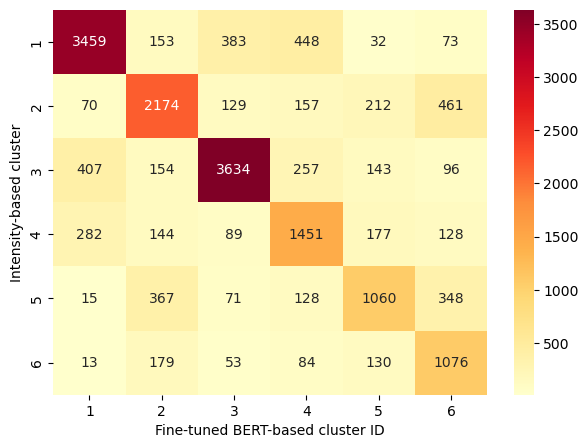

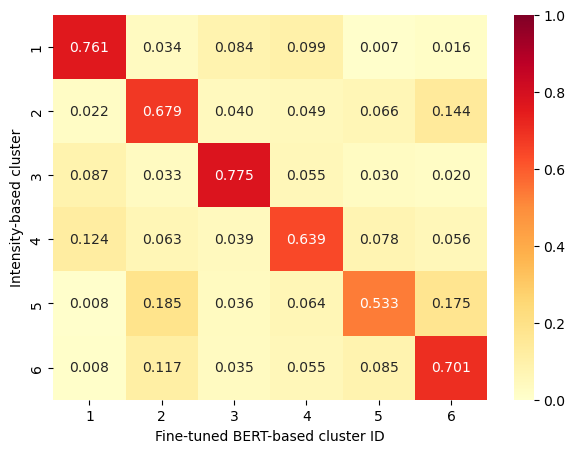

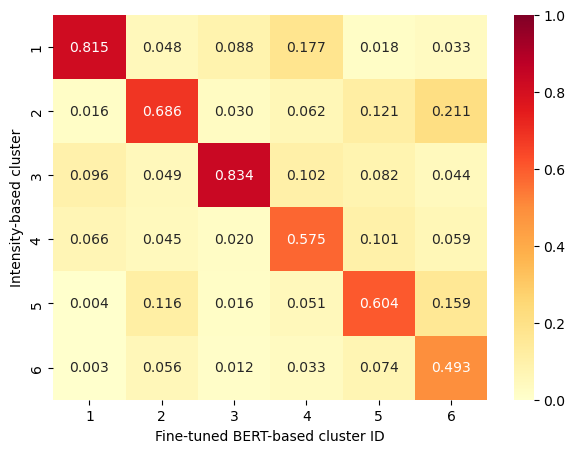

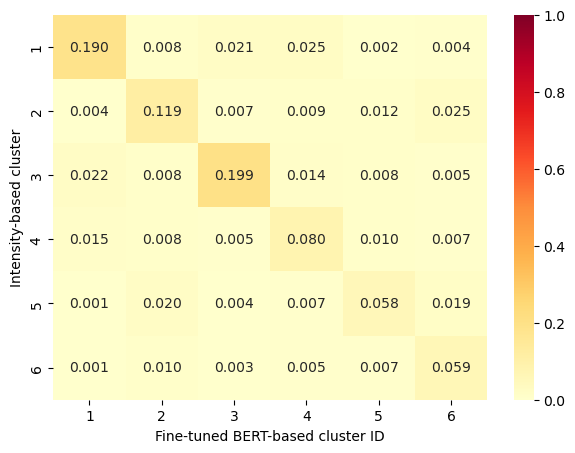

In [10]:
df_clusters = pd.DataFrame(clusters, columns=['clusters'])
conf_mat = confusion_matrix(df_intensity_clusters['labels'], df_clusters['clusters'], labels=list(set(emotion_clusters))) # confusion matrix
# conf_mat_norm_by_row = conf_mat.astype('float') / conf_mat.sum(axis=1)[:, np.newaxis] # Normalize the confusion matrix by row. 
# conf_mat_norm_by_column = conf_mat.astype('float') / conf_mat.sum(axis=0)[:, np.newaxis] # Normalize the confusion matrix by row. 

conf_mat_norm_by_row = confusion_matrix(df_intensity_clusters['labels'], df_clusters['clusters'], labels=list(set(emotion_clusters)), normalize='true') 
conf_mat_norm_by_column = confusion_matrix(df_intensity_clusters['labels'], df_clusters['clusters'], labels=list(set(emotion_clusters)), normalize='pred') 
conf_mat_norm_by_all = confusion_matrix(df_intensity_clusters['labels'], df_clusters['clusters'], labels=list(set(emotion_clusters)), normalize='all') 

# Heatmap of the confusion matrix
plt.figure(figsize=(7, 5))
sns.heatmap(conf_mat, annot=True, cmap='YlOrRd', fmt='g')
plt.xlabel(dic_of_x_axis_labels[flag])
plt.ylabel('Intensity-based cluster')
plt.xticks(np.arange(len(set(emotion_clusters))) + 0.5, range(1, len(set(emotion_clusters)) + 1))
plt.yticks(np.arange(len(set(emotion_clusters))) + 0.5, range(1, len(set(emotion_clusters)) + 1))
plt.show()

# Heatmap of the normalized confusion matrix
plt.figure(figsize=(7, 5))
sns.heatmap(conf_mat_norm_by_row, annot=True, cmap='YlOrRd', fmt='.3f', vmin=0, vmax=1)
plt.xlabel(dic_of_x_axis_labels[flag])
plt.ylabel('Intensity-based cluster')
plt.xticks(np.arange(len(set(emotion_clusters))) + 0.5, range(1, len(set(emotion_clusters)) + 1))
plt.yticks(np.arange(len(set(emotion_clusters))) + 0.5, range(1, len(set(emotion_clusters)) + 1))
plt.show()

# Heatmap of the normalized confusion matrix
plt.figure(figsize=(7, 5))
sns.heatmap(conf_mat_norm_by_column, annot=True, cmap='YlOrRd', fmt='.3f', vmin=0, vmax=1)
plt.xlabel(dic_of_x_axis_labels[flag])
plt.ylabel('Intensity-based cluster')
plt.xticks(np.arange(len(set(emotion_clusters))) + 0.5, range(1, len(set(emotion_clusters)) + 1))
plt.yticks(np.arange(len(set(emotion_clusters))) + 0.5, range(1, len(set(emotion_clusters)) + 1))
plt.show()

plt.figure(figsize=(7, 5))
sns.heatmap(conf_mat_norm_by_all, annot=True, cmap='YlOrRd', fmt='.3f', vmin=0, vmax=1)
plt.xlabel(dic_of_x_axis_labels[flag])
plt.ylabel('Intensity-based cluster')
plt.xticks(np.arange(len(set(emotion_clusters))) + 0.5, range(1, len(set(emotion_clusters)) + 1))
plt.yticks(np.arange(len(set(emotion_clusters))) + 0.5, range(1, len(set(emotion_clusters)) + 1))
plt.show()


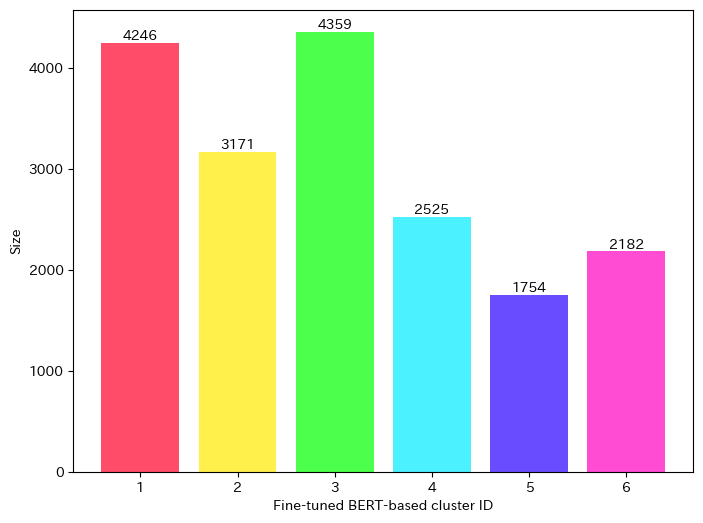

In [11]:
# setting Japanese font
font_manager.fontManager.addfont('fonts/ipaexg.ttf')
matplotlib.rc('font', family="IPAexGothic")

# frequency of each cluster
cluster_IDs, counts = np.unique(clusters, return_counts=True) # cluster_IDs = [1, 2, 3, 4, 5, 6]



cmap = plt.get_cmap('gist_rainbow', k) 
cmap2 = cmap.copy()
colors = cmap2(np.linspace(0, 1, len(cluster_IDs)))


plt.figure(figsize=(8, 6))
bars = plt.bar(cluster_IDs, counts, color=colors, alpha=0.7)
plt.xlabel(dic_of_x_axis_labels[flag])
plt.ylabel('Size')
# plt.title(f'Size of Pretrained BERT-based clusters')
plt.xticks(cluster_IDs)

# Display texts
for bar in bars:
    height = bar.get_height()
    plt.text(bar.get_x() + bar.get_width() / 2, height, height, ha='center', va='bottom')

plt.show()

In [12]:
# Similarity between tweets.

from sklearn.metrics.pairwise import cosine_similarity

target_index = 1 # find similar sentences to this sentence.

df_wrime_target['similarity'] = cosine_similarity(df_embeddings[target_index:target_index+1], df_embeddings)[0]
best3_similarity_sentence = df_wrime_target.sort_values('similarity', ascending=False)[['Sentence', 'similarity']].head(4)
worst3_similarity_sentence = df_wrime_target.sort_values('similarity', ascending=True)[['Sentence', 'similarity']].head(3)

for i, row in best3_similarity_sentence.iterrows():
    print(f'index: {i}')
    print(f'Tweet: {row["Sentence"]}')
    print(f'Similarity = {row["similarity"]}')
    print('---')

for i, row in worst3_similarity_sentence.iterrows():
    print(f'index: {i}')
    print(f'Tweet: {row["Sentence"]}')
    print(f'Similarity = {row["similarity"]}')
    print('---')

index: 1
Tweet: 今日の月も白くて明るい。昨日より雲が少なくてキレイな? と立ち止まる帰り道｡チャリなし生活も悪くない｡
Similarity = 0.9999999999999996
---
index: 7592
Tweet: あー。明日の準備して楽しい気分やったのも一瞬や。なんだかなー。明日、学校いって、出会ってしまったらどうしよーとか考えたら気分が悪い。キャリアの人いや。
Similarity = 0.9657318431532449
---
index: 5020
Tweet: これ、地震酔いってやつなのかもしれん。ずっと揺れてる感じで気持ち悪い。吐き気も。こういう時ひとりだと心細いな…
Similarity = 0.9649785437922673
---
index: 7654
Tweet: 学校でぼっちとか通常なんやけど、今日に限ってうまく物事が進まなくてイライラしてるぬ。
Similarity = 0.9645316264799246
---
index: 11951
Tweet: 【子供向けのモザンビーク紹介動画】\n知人の紹介で日本の教育施設と繋がりを持て、今度そこの子供達と交流することになりました！\n\n担当者とZoomで話し合い『まずはモザンビーク紹介動画を作り、それを子どもたちに観せて反応をみる』ことに決定。\n\n子どもに伝わる動画編集、未知。だがそれがいい。
Similarity = 0.12531399188236717
---
index: 18205
Tweet: 街に出て、コワーキングスペースデビュー。_x000D_\nランチは熊本で一番美味しいとんかつ店。_x000D_\nコンタクトレンズを買って不安が解消。_x000D_\n最後はMUJIの新しい店舗で、週末のイベント用クリアファイルと紐を買ってきた。_x000D_\n夜、フィンランドつながりの方から「イベント参加します」のメッセージをいただいた。いい日。
Similarity = 0.1260737369283936
---
index: 1768
Tweet: 朝仕込んだバインフランをおやつに食べてみようかな。要はカスタードプリンらしいけど、カラメルソースがコーヒーソースになっている。楽しみ。
Similarity = 0.126205998214496

Plots:
PCA label= generated embeddings cluster IDs (GECI)
PCA label= emotion intensity-based cluster IDs (EICI)
t-SNE label= GECI
t-SNE label= EICI
UMAP label= GECI
UMAP label= EICI

/home/om/.miniconda3/envs/emotion/lib/python3.11/site-packages/umap/distances.py:1063: NumbaDeprecationWarning: The 'nopython' keyword argument was not supplied to the 'numba.jit' decorator. The implicit default value for this argument is currently False, but it will be changed to True in Numba 0.59.0. See https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-object-mode-fall-back-behaviour-when-using-jit for details.
  @numba.jit()
/home/om/.miniconda3/envs/emotion/lib/python3.11/site-packages/umap/distances.py:1071: NumbaDeprecationWarning: The 'nopython' keyword argument was not supplied to the 'numba.jit' decorator. The implicit default value for this argument is currently False, but it will be changed to True in Numba 0.59.0. See https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-object-mode-fall-back-behaviour-when-using-jit for details.
  @numba.jit()
/home/om/.miniconda3/envs/emotion/lib/python3.11/site-packages/umap/dist

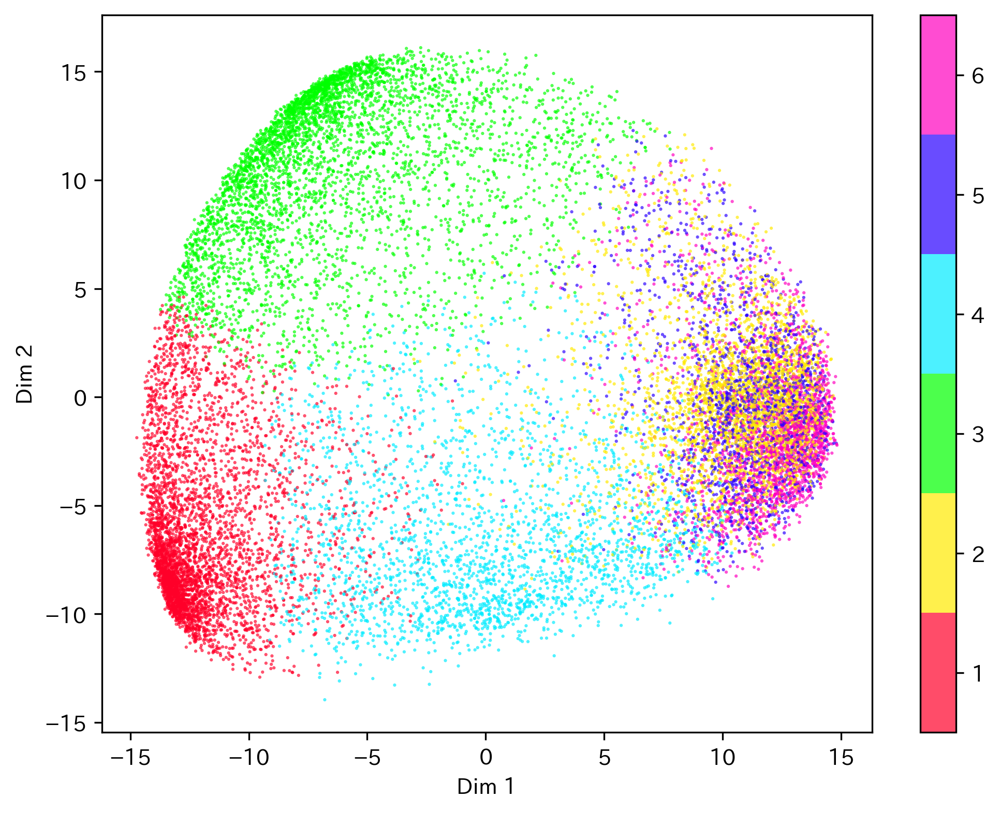

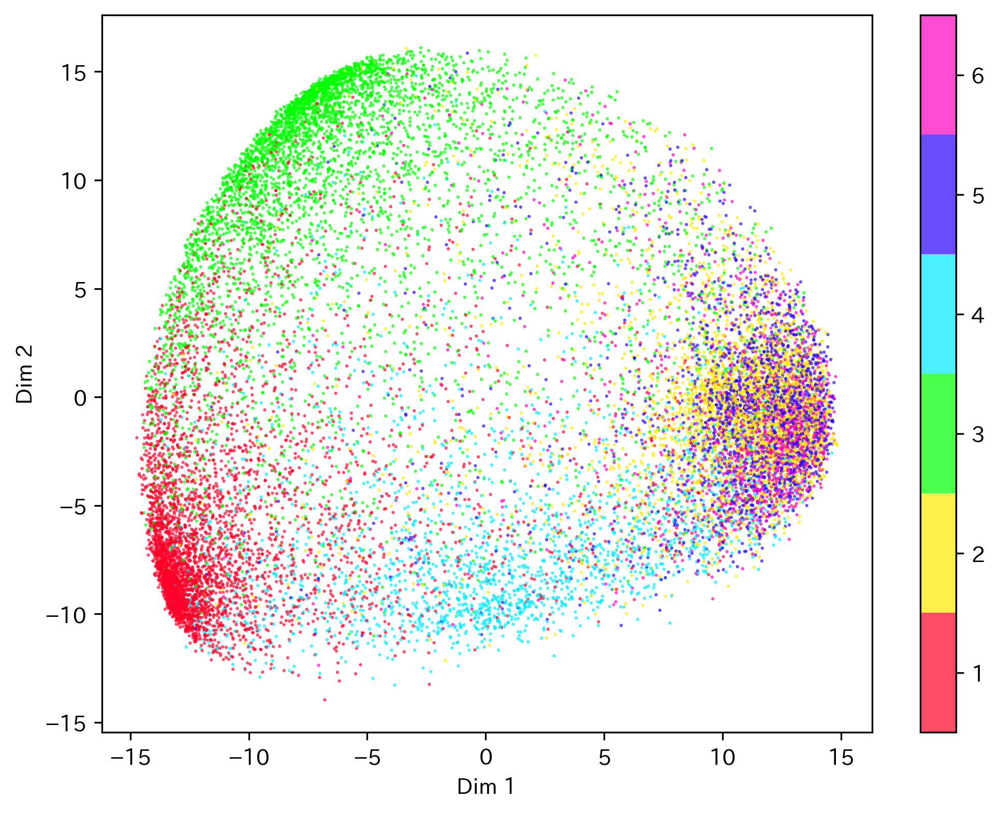

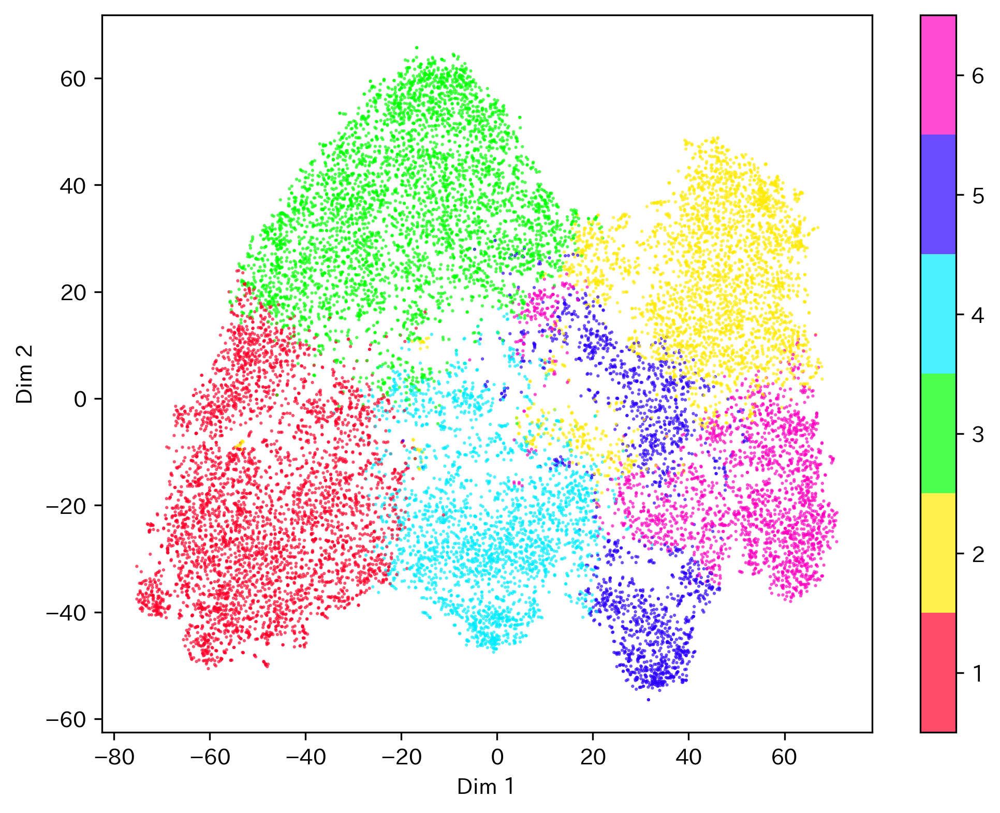

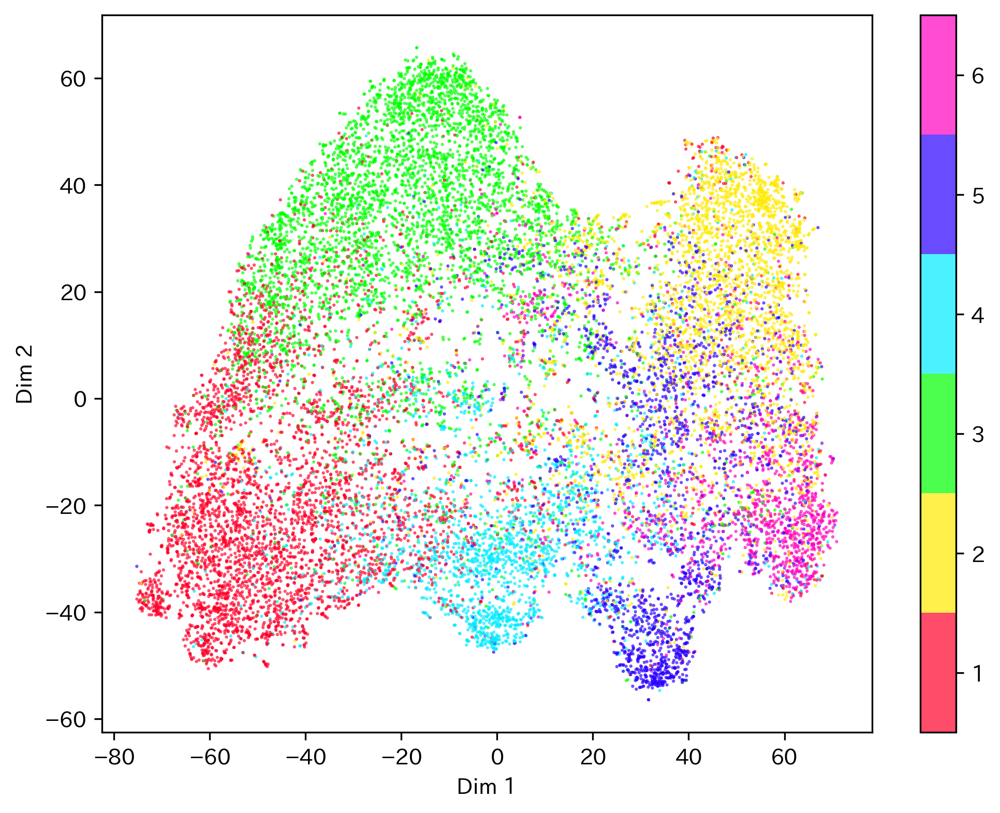

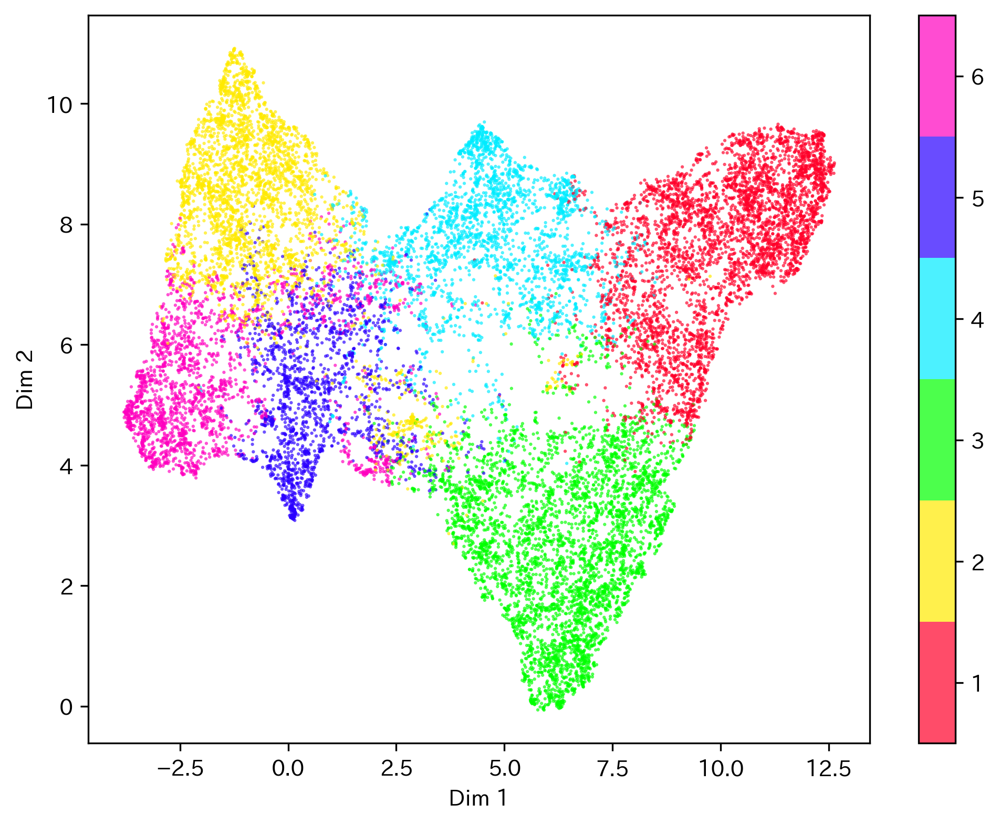

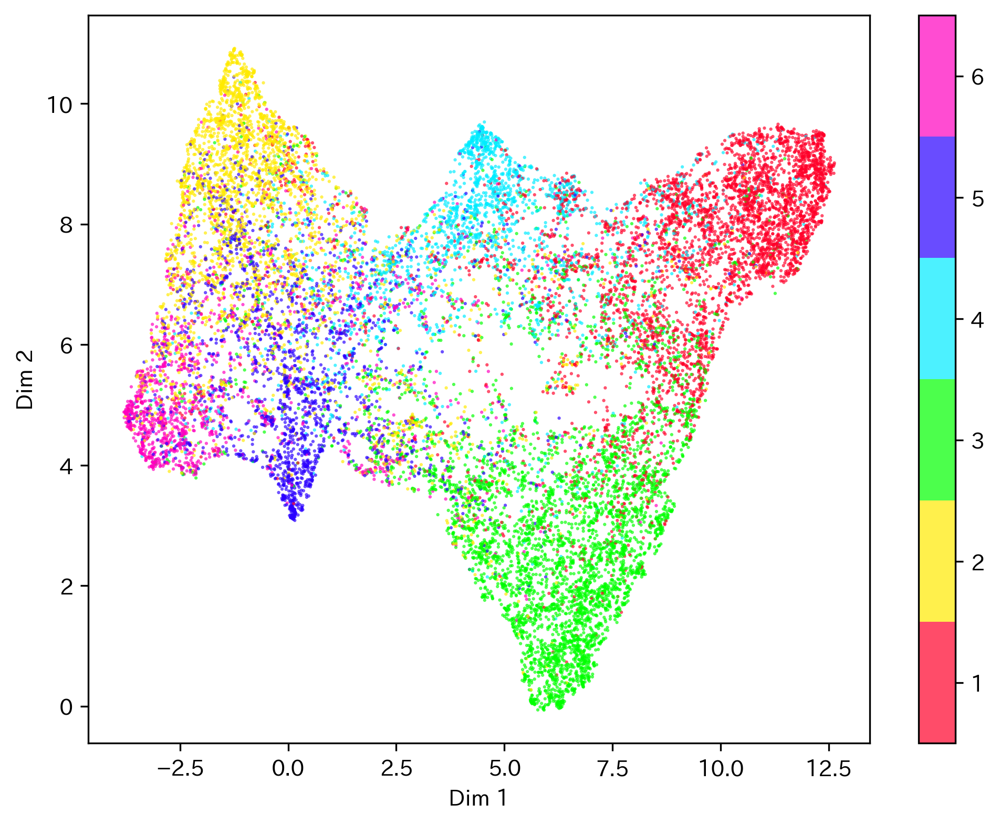

In [13]:
df_wrime_features_pca, df_wrime_features_tsne, df_wrime_features_umap = appy_dimensionality_reduction(df_embeddings, clusters, emotion_clusters, num_of_colors=k)

# Finding the optimal cluster size

In [14]:
k_max=41

In [15]:
'''
from sklearn.cluster import KMeans

# Survey of optimal number of clusters by Elbow Method
SSE = []
for i in range(2, k_max):
    kmeans_model = KMeans(n_clusters=i, random_state=0).fit(df_embeddings)
    SSE.append(kmeans_model.inertia_)

# 可視化
plt.figure(figsize=(8, 6))
plt.plot(range(2, k_max), SSE, marker='o', markersize=3)
plt.xlabel('k')
plt.xticks(np.arange(2, k_max, 1), fontsize=8)
plt.ylabel('SSE')
plt.title('Survey of optimal number of clusters by Elbow Method')
plt.grid(True)
plt.show()
'''

"\nfrom sklearn.cluster import KMeans\n\n# Survey of optimal number of clusters by Elbow Method\nSSE = []\nfor i in range(2, k_max):\n    kmeans_model = KMeans(n_clusters=i, random_state=0).fit(df_embeddings)\n    SSE.append(kmeans_model.inertia_)\n\n# 可視化\nplt.figure(figsize=(8, 6))\nplt.plot(range(2, k_max), SSE, marker='o', markersize=3)\nplt.xlabel('k')\nplt.xticks(np.arange(2, k_max, 1), fontsize=8)\nplt.ylabel('SSE')\nplt.title('Survey of optimal number of clusters by Elbow Method')\nplt.grid(True)\nplt.show()\n"

In [16]:
'''
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score

# Survey of optimal number of clusters by Silhouette Coefficient
silhouette_coefficients = []
for i in range(2, k_max):
    kmeans_model = KMeans(n_clusters=i, random_state=0).fit(df_embeddings)
    silhouette_coefficient = silhouette_score(df_embeddings, kmeans_model.labels_) # シルエット係数の平均値
    silhouette_coefficients.append(silhouette_coefficient)


# 可視化
plt.figure(figsize=(8, 6))
plt.plot(range(2, k_max), silhouette_coefficients, marker='o', markersize=3)
plt.xlabel('k')
plt.xticks(np.arange(2, k_max, 1), fontsize=8)
plt.ylabel('Silhouette Coefficient')
plt.title('Survey of optimal number of clusters by Silhouette Coefficient')
plt.grid(True)
plt.show()
'''

"\nfrom sklearn.cluster import KMeans\nfrom sklearn.metrics import silhouette_score\n\n# Survey of optimal number of clusters by Silhouette Coefficient\nsilhouette_coefficients = []\nfor i in range(2, k_max):\n    kmeans_model = KMeans(n_clusters=i, random_state=0).fit(df_embeddings)\n    silhouette_coefficient = silhouette_score(df_embeddings, kmeans_model.labels_) # シルエット係数の平均値\n    silhouette_coefficients.append(silhouette_coefficient)\n\n\n# 可視化\nplt.figure(figsize=(8, 6))\nplt.plot(range(2, k_max), silhouette_coefficients, marker='o', markersize=3)\nplt.xlabel('k')\nplt.xticks(np.arange(2, k_max, 1), fontsize=8)\nplt.ylabel('Silhouette Coefficient')\nplt.title('Survey of optimal number of clusters by Silhouette Coefficient')\nplt.grid(True)\nplt.show()\n"

### Plot showing silhouette scores

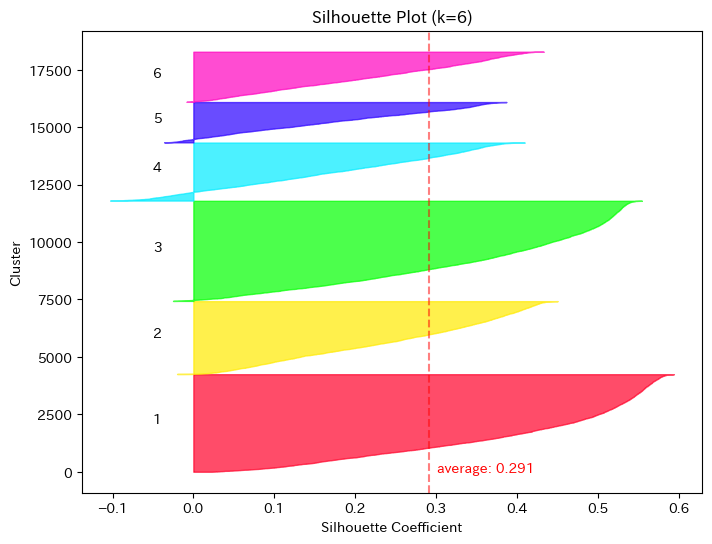

In [17]:
from sklearn.metrics import silhouette_score
from sklearn.metrics import silhouette_samples
import matplotlib.cm as cm

silhouette_avg = silhouette_score(df_embeddings, clusters)
silhouette_values = silhouette_samples(df_embeddings, clusters)

# visualize the silhouette plot
plt.figure(figsize=(8, 6))
y_lower = 0
for i, cluster in enumerate(cluster_IDs):
    cluster_silhouette_values = silhouette_values[clusters == cluster]
    cluster_silhouette_values.sort()
    cluster_size = cluster_silhouette_values.shape[0]
    y_upper = y_lower + cluster_size
    plt.fill_betweenx(np.arange(y_lower, y_upper), 0, cluster_silhouette_values, facecolor=colors[i], edgecolor=colors[i], alpha=0.7)
    plt.text(-0.05, y_lower + 0.5 * cluster_size, str(i+1))
    y_lower = y_upper + 10

# 
plt.axvline(x=silhouette_avg, color="red", linestyle="--", alpha=0.5)
plt.text(silhouette_avg + 0.01, -20, f"average: {silhouette_avg:.3f}", color="red")

plt.xlabel('Silhouette Coefficient')
plt.ylabel('Cluster')
plt.title(f'Silhouette Plot (k={k})')
plt.show()

In [18]:
# The tweet with the highest silhouette coefficient in each intensity-based cluster
for i, cluster in enumerate(cluster_IDs):
    cluster_silhouette_values = silhouette_values[clusters == cluster]
    cluster_silhouette_values.sort()
    index = np.where(silhouette_values == cluster_silhouette_values[-1])[0][0]
    print(f'Intensity-based cluster ID: {clusters[index]}')
    print(f'The highest scored tweet: {df_wrime_target.iloc[index, 0]}')
    print(f'Silhouette score: {cluster_silhouette_values[-1]:.3f}')
    print('---')

Intensity-based cluster ID: 1
The highest scored tweet: いやぁ、サヨナラノツバサ映像付きでライブやってくれるのか本当最高やったわ。6年間を回収できたわ
Silhouette score: 0.594
---
Intensity-based cluster ID: 2
The highest scored tweet: 歳のせいか、友人とも音楽の話をほとんどしなくなってしまった（僕だけ！？）\n\nなんか寂しさも感じるのよねぇ(^^;
Silhouette score: 0.451
---
Intensity-based cluster ID: 3
The highest scored tweet: 意味なくプライムデーのsurface pro Xセット欲しい。今のでも十分なんだし買うならデスクトップ買えばいいけどXほしい。格安シム入れて外でカタカタしたい。
Silhouette score: 0.555
---
Intensity-based cluster ID: 4
The highest scored tweet: まってゼウス！？！？！？！？！？！ほんとに！？！！？！？
Silhouette score: 0.410
---
Intensity-based cluster ID: 5
The highest scored tweet: インフルエンザこわい。 四日間きっちりのたうち回った。 今朝になってやっと、人間の体温になった。 あと１日は出歩くなと言われてるけど、明日から仕事なんだがどうしよう
Silhouette score: 0.387
---
Intensity-based cluster ID: 6
The highest scored tweet: めっちゃもやもやするけれど沈黙は金だよ。多分。「口が開かないんでしょ。図星だからでしょ」って思ってんだろうな～馬鹿め。
Silhouette score: 0.433
---


In [19]:
# Display the top 5 tweets with the highest silhouette coefficients in each cluster
target_cluster = 5
cluster_silhouette_values = silhouette_values[clusters == target_cluster]
cluster_silhouette_values.sort()
for i in range(5):
    index = np.where(silhouette_values == cluster_silhouette_values[-i - 1])[0][0]
    print(f'Intensity-based cluster ID: {clusters[index]}')
    print(f'The highest scored tweet: {df_wrime_target.iloc[index, 0]}')
    print(f'Silhouette score: {cluster_silhouette_values[-1]:.3f}')
    print('---')



Intensity-based cluster ID: 5
The highest scored tweet: インフルエンザこわい。 四日間きっちりのたうち回った。 今朝になってやっと、人間の体温になった。 あと１日は出歩くなと言われてるけど、明日から仕事なんだがどうしよう
Silhouette score: 0.387
---
Intensity-based cluster ID: 5
The highest scored tweet: 大潮なのに台風来るのね。大室のばあちゃん家海から徒歩30秒なんだけど、高潮被ったりしないか心配。海には近付かない方がいいよー。
Silhouette score: 0.387
---
Intensity-based cluster ID: 5
The highest scored tweet: 今日6時だと思ってたけど、4時からやんな…危ない
Silhouette score: 0.387
---
Intensity-based cluster ID: 5
The highest scored tweet: あー、今日も無駄に息をしている…。卒制しなくちゃ…。明日はゼミだ…。怖い…。サボルか(^q^)
Silhouette score: 0.387
---
Intensity-based cluster ID: 5
The highest scored tweet: 金縛りにかかって2重に夢みてた…マトリックスかよ…そろそろ怖くなってきたから医者に行った方がいいのかな
Silhouette score: 0.387
---


### From the embeddings of tweets generated by the pretrained BERT model, infer the intensity-based cluster IDs

In [20]:
# df_wrime_target['Train/Dev/Test'], df_embeddings, df_intensity_clustersを結合
df_embeddings_clusters = pd.concat([df_wrime_target['Train/Dev/Test'], df_embeddings, df_intensity_clusters], ignore_index=True, axis=1)
df_embeddings_clusters.iloc[:, -1] = df_embeddings_clusters.iloc[:, -1] - 1

df_embeddings_clusters

,0,1,2,3,4,5,6,7,8,9,...,760,761,762,763,764,765,766,767,768,769
0,train,0.365218,1.149963,1.203254,0.352323,-0.484655,-0.067023,1.198367,-0.816710,0.659456,...,-1.529703,0.582815,-1.500191,0.164042,-1.906662,1.980481,0.021274,0.598890,-0.827878,1
1,train,-0.082361,1.071828,1.268558,1.203127,-0.002173,0.160753,0.881701,-0.602653,0.660984,...,-1.427082,0.349400,-0.706855,0.473155,-1.427108,2.077540,0.165607,0.513011,-0.886685,3
2,train,0.612580,-0.329905,0.308975,-1.093565,-0.408990,0.988384,-0.122575,-0.759017,1.107413,...,-1.169437,1.455196,-0.712238,-1.442249,-1.128440,0.858635,0.630934,0.358014,-0.992439,0
3,train,-0.266250,-0.919471,0.611845,-0.773464,-0.528438,0.733223,0.461389,0.089172,-0.052157,...,-0.384616,-0.026527,0.075046,-1.341623,-1.003404,0.290965,0.373007,-1.751636,-1.316648,2
4,train,0.693826,-0.189559,-0.040115,0.118144,-0.734203,1.485114,0.268563,0.548660,0.712781,...,-0.199193,0.595194,0.091787,-1.045303,-1.102725,0.477617,1.073650,-0.780606,-0.958063,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
18232,train,-0.018443,-1.136293,0.040635,-1.298723,-1.445697,1.257638,0.308170,-0.534157,0.790609,...,-0.712093,0.688874,-0.278060,-1.075001,-1.191734,-0.140081,0.996684,-1.286677,-1.315569,0
18233,train,0.065328,-1.105787,0.026793,-1.117611,-1.180139,0.627712,0.091798,0.356997,0.579937,...,-0.239916,0.378591,0.111710,-1.555697,-0.434472,-0.038305,1.162913,-1.362732,-1.549631,2
18234,train,-0.633033,-1.192253,0.182466,-1.758809,-1.372255,1.687350,-0.109954,-1.110170,1.154791,...,-1.072943,1.033097,-0.337109,-0.438017,-1.182819,-0.218141,0.465897,-0.711377,-1.151398,0
18235,train,-0.157209,-1.017729,0.128788,-0.513604,-0.756274,0.623777,0.607451,1.001493,0.002552,...,-0.146003,-0.524057,0.313295,-1.604620,-0.287903,0.303467,1.057344,-1.539088,-1.359835,2


In [21]:
# divide into train and test
df_groups = df_embeddings_clusters.groupby(0)
df_train = df_groups.get_group('train')
df_test = pd.concat([df_groups.get_group('dev'), df_groups.get_group('test')])
print('train :', len(df_train))  # train : 17104
print('test :', len(df_test))    # test : 1133

train : 17104
test : 1133


In [22]:
import xgboost as xgb

# Make input data to xgboost
train_data = df_train.drop([0, 769], axis=1).values
train_labels = df_train[769].values

test_data = df_test.drop([0, 769], axis=1).values
test_labels = df_test[769].values

train_data = xgb.DMatrix(train_data, label=train_labels)
test_data = xgb.DMatrix(test_data, label=test_labels)

[0]	train-mlogloss:1.28401	test-mlogloss:1.15811
[1]	train-mlogloss:1.10131	test-mlogloss:0.93178
[2]	train-mlogloss:0.99881	test-mlogloss:0.80797
[3]	train-mlogloss:0.93856	test-mlogloss:0.73096
[4]	train-mlogloss:0.89929	test-mlogloss:0.68063
[5]	train-mlogloss:0.87347	test-mlogloss:0.64612
[6]	train-mlogloss:0.85549	test-mlogloss:0.62467
[7]	train-mlogloss:0.84259	test-mlogloss:0.60816
[8]	train-mlogloss:0.83298	test-mlogloss:0.59729
[9]	train-mlogloss:0.82541	test-mlogloss:0.58828
[10]	train-mlogloss:0.81951	test-mlogloss:0.58014
[11]	train-mlogloss:0.81470	test-mlogloss:0.57388
[12]	train-mlogloss:0.81070	test-mlogloss:0.56979
[13]	train-mlogloss:0.80731	test-mlogloss:0.56623
[14]	train-mlogloss:0.80432	test-mlogloss:0.56519
[15]	train-mlogloss:0.80139	test-mlogloss:0.56226
[16]	train-mlogloss:0.79881	test-mlogloss:0.56101
[17]	train-mlogloss:0.79641	test-mlogloss:0.56068
[18]	train-mlogloss:0.79417	test-mlogloss:0.56055
[19]	train-mlogloss:0.79203	test-mlogloss:0.55801
[20]	train

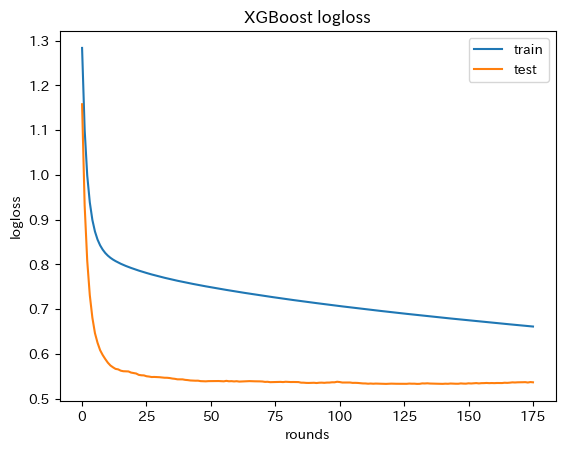

In [23]:
# Model
params = {
    'objective': 'multi:softmax',
    'num_class': len(set(emotion_clusters)),
    'eval_metric': 'mlogloss',
    'verbosity': 0,
    'seed': 0,
    'max_depth': 1,
    'eta': 0.5,
}

history = dict()

# learning
model = xgb.train(params, train_data, evals=[(train_data, 'train'), (test_data, 'test')], evals_result=history, num_boost_round=1000, early_stopping_rounds=50)

# prediciton
preds_labels = model.predict(test_data)

# Visualization
plt.plot(history['train']['mlogloss'], label='train')
plt.plot(history['test']['mlogloss'], label='test')
plt.xlabel('rounds')
plt.ylabel('logloss')
plt.title('XGBoost logloss')
plt.legend()
plt.show()

In [24]:
test_labels += 1
preds_labels += 1

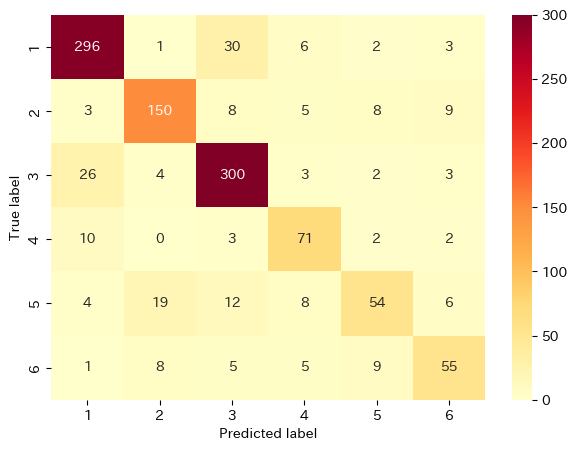

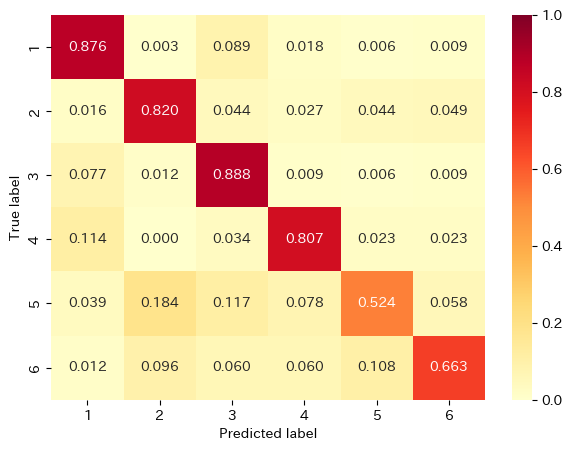

              precision    recall  f1-score   support

           1      0.871     0.876     0.873       338
           2      0.824     0.820     0.822       183
           3      0.838     0.888     0.862       338
           4      0.724     0.807     0.763        88
           5      0.701     0.524     0.600       103
           6      0.705     0.663     0.683        83

    accuracy                          0.817      1133
   macro avg      0.777     0.763     0.767      1133
weighted avg      0.815     0.817     0.814      1133



In [25]:
# from sklearn.metrics import confusion_matrix, classification_report
# import seaborn as sns

cm = confusion_matrix(test_labels, preds_labels, labels=list(set(emotion_clusters)))

# visualize the confusion matrix
plt.figure(figsize=(7, 5))
sns.heatmap(cm, annot=True, cmap='YlOrRd', fmt='g')
plt.xlabel('Predicted label')
plt.ylabel('True label')
plt.xticks(np.arange(len(set(emotion_clusters))) + 0.5, range(1, len(set(emotion_clusters)) + 1))
plt.yticks(np.arange(len(set(emotion_clusters))) + 0.5, range(1, len(set(emotion_clusters)) + 1))
plt.show()

# Normalize the confusion matrix
cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]

# visualize the confusion matrix
plt.figure(figsize=(7, 5))
sns.heatmap(cm, annot=True, cmap='YlOrRd', fmt='.3f', vmin=0, vmax=1)
plt.xlabel('Predicted label')
plt.xticks(np.arange(len(set(emotion_clusters))) + 0.5, range(1, len(set(emotion_clusters)) + 1))
plt.yticks(np.arange(len(set(emotion_clusters))) + 0.5, range(1, len(set(emotion_clusters)) + 1))
plt.ylabel('True label')
plt.show()

# Classification report
print(classification_report(test_labels, preds_labels, digits=3))

k = 6  
'cl-tohoku/bert-base-japanese-whole-word-masking' は accuracy 60%  
'cl-tohoku/bert-base-japanese-v2' は accuracy 58.6%

In [26]:
# Indices of false predictions
false_preds = np.where(test_labels != preds_labels)[0]

# Show the first 5 false predictions
for i in false_preds[10:15]:
    print(df_wrime_target.iloc[i]['Sentence'])
    print('True label:', test_labels[i])
    print('Predicted label:', preds_labels[i])
    print('---')

よっしゃ～終わった！お腹すいた～！
True label: 1
Predicted label: 3.0
---
実家の母は、普段話し相手がいないのか、たまに帰るとむちゃくちゃ喋ってくる。今回、風邪気味で無口だったので、静かな正月となった。二泊三日の最終日、私を送り出す駅のホームで急に喋りだした。え、今？ どうやら風邪は治ったようです。
True label: 5
Predicted label: 2.0
---
今日か明日、えべっさん行きたいな～
True label: 5
Predicted label: 3.0
---
無印の焦がしキャラメルってお菓子がおいしすぎる。
True label: 1
Predicted label: 3.0
---
すんごい雨…新成人の皆さんおめでとうございます。そして御苦労様…てか福くん可愛いな～@いいとも
True label: 5
Predicted label: 3.0
---


---